In [2]:
source('utils_celldive.R')

# Initialize and QC 

## metadata

In [3]:
cells <- list()

cells$metadata <- map(c('JPR125', 'JPR118'), function(libname) {
    # fread(glue('../../data/CellDive/results/{libname}_metadata.csv')) %>% 
    fread(glue('../../../{libname}_metadata.csv')) %>% 
        dplyr::select(-V1) %>% 
        tibble::remove_rownames() %>% 
        tibble::rowid_to_column('CellNum') %>% 
        dplyr::mutate(CellID = paste0('Cell', CellNum, '_', libname)) %>%
        dplyr::mutate(LibraryID = libname)  %>% 
        dplyr::select(CellID, LibraryID, x, y, area, everything()) %>% 
        data.frame()
}) %>% 
     bind_rows()


In [30]:
# cells$metadata %>% 
#     split(.$LibraryID) %>% 
#     imap(function(.SD, .name) {
#         .SD %>% arrange(-y) %>% head(3)
#     })

In [4]:
## Offset y so we can plot images in same space 
cells$metadata <- cells$metadata %>% 
    dplyr::mutate(x_img = x, y_img = y) %>% 
    dplyr::mutate(y = case_when(
        LibraryID == 'JPR118' ~ y_img,
        LibraryID == 'JPR125' ~ y_img + 14000
    ))

table(cells$metadata$LibraryID)
head(cells$metadata)


JPR118 JPR125 
 22282  42873 

,CellID,LibraryID,x,y,area,CellNum,convex_area,solidity,major_axis_length,orientation,minor_axis_length,extent,perimeter,equivalent_diameter,euler_number,eccentricity,x_img,y_img
,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
1,Cell1_JPR125,JPR125,1607.619,17515.52,113,1,118,0.9576271,15.73912,-0.60142911,9.196452,0.6726190,39.21320,11.99484,1,0.8115340,1607.619,3515.522
2,Cell2_JPR125,JPR125,1690.479,17236.23,238,2,243,0.9794239,20.29073,-0.96715835,14.978843,0.7368421,55.69848,17.40779,1,0.6745699,1690.479,3236.231
3,Cell3_JPR125,JPR125,1719.984,17115.63,486,3,503,0.9662028,27.25216,-0.81708448,22.910646,0.7476923,82.76955,24.87558,1,0.5415150,1719.984,3115.634
4,Cell4_JPR125,JPR125,1723.836,17007.38,536,4,567,0.9453263,32.68012,-1.51278529,21.170068,0.7061924,89.84062,26.12387,1,0.7618134,1723.836,3007.377
5,Cell5_JPR125,JPR125,1723.913,17139.59,715,5,736,0.9714674,32.94340,-0.21086883,28.077820,0.8237327,100.18377,30.17228,1,0.5230454,1723.913,3139.587
6,Cell6_JPR125,JPR125,1722.782,17156.47,174,6,187,0.9304813,21.16474,-0.02187017,10.889540,0.7190083,54.17767,14.88434,1,0.8574824,1722.782,3156.466


## intensity

In [5]:
intensity_list <- map(c('JPR125', 'JPR118'), function(libname) {
    X <- fread(glue('../../../{libname}_intensity.csv'))[, V1:=NULL][] %>% 
    # X <- fread(glue('../../data/CellDive/results/{libname}_intensity.csv'))[, V1:=NULL][] %>% 
        data.frame()
    rownames(X) <- glue('Cell{1:nrow(X)}_{libname}')
    return(X)
}) 


In [6]:
feature_names_df <- c(
    ACTA2='ASMA', 'ASMA'='ASMA', 
    VIM='VIM', VIMENTIN='VIM', 
    CK8='PANCK', PANCK='PANCK', 
    CD90='CD90', THY1='CD90'
)
features_raw <- intensity_list %>% map(colnames) %>% reduce(union)
features_other <- setdiff(features_raw, names(feature_names_df))
x <- features_other
names(x) <- features_other
feature_names_df <- c(feature_names_df, x)


In [7]:
intensity_list <- intensity_list %>% map(colnames) %>% imap(function(x, .name) {
    features_keep <- x %>% setdiff(c('CD14', 'CD34', 'CDH11'))
    features_rename <- feature_names_df[features_keep]
    res <- intensity_list[[.name]][features_keep]
    colnames(res) <- features_rename
    return(res)
})

In [8]:
cells$intensity <- bind_rows(intensity_list)

In [9]:
saveRDS(cells, '../../data/CellDive/cache/synovium_cells_raw.rds')

## QC cells on DAPI 

In [36]:
cells <- do_norm(cells)

In [37]:
cells$metadata$dapi_deviation <- with(cells$intensity_norm, abs(log1p(DAPI_INIT) - log1p(DAPI_FINAL))/log1p(DAPI_INIT))


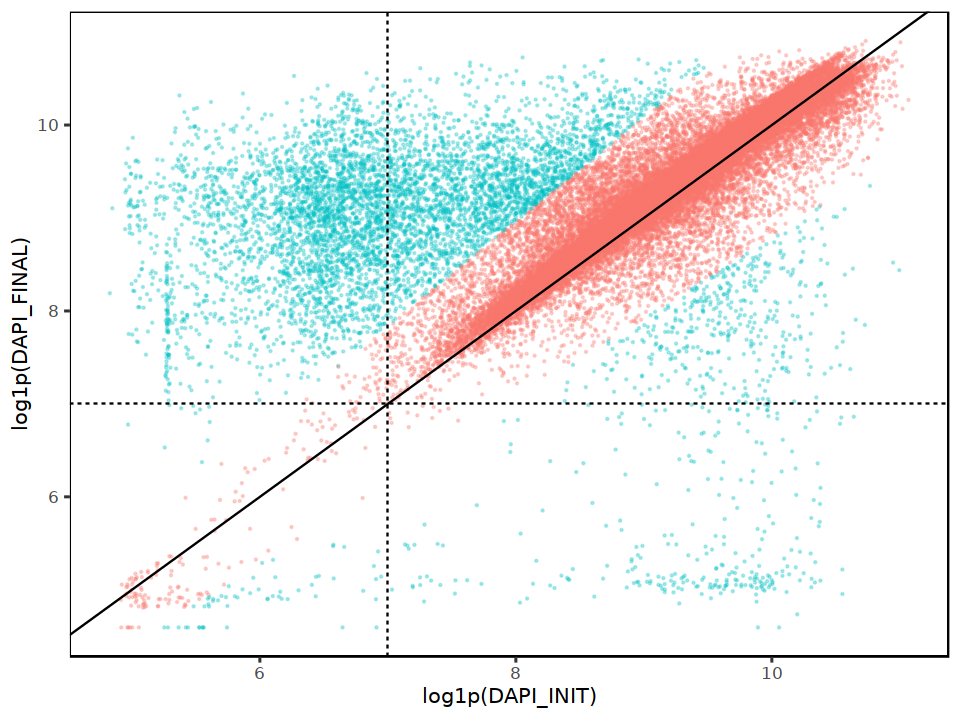

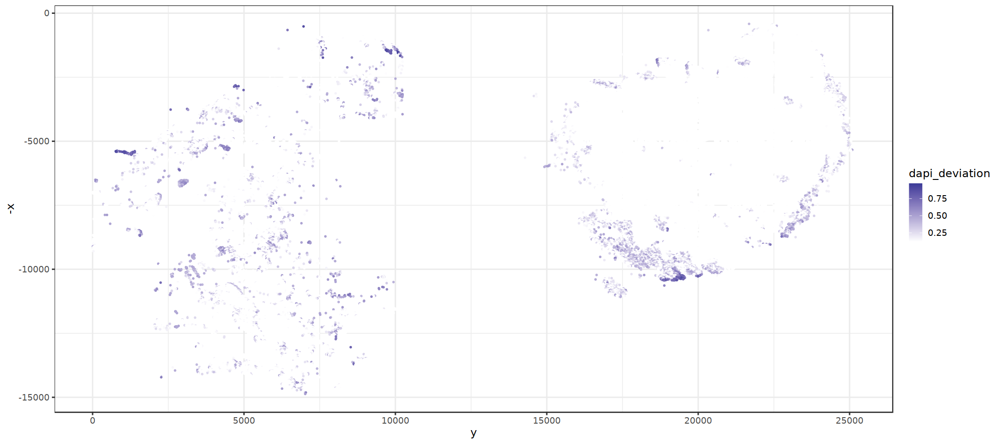

In [38]:
fig.size(6, 8)
cells$intensity_norm %>% 
    cbind(cells$metadata) %>% 
    ggplot(aes(log1p(DAPI_INIT), log1p(DAPI_FINAL), color = dapi_deviation > .12)) + 
        geom_point(size = .2, alpha = .3) + 
        geom_abline() + 
        guides(color = 'none') + 
        geom_hline(yintercept=7, linetype=2) + 
        geom_vline(xintercept=7, linetype=2) + 
        NULL


fig.size(8, 18)
cells$metadata %>% 
    ggplot(aes(y, -x)) + 
        geom_point(size=.5, aes(color = dapi_deviation)) + 
        theme_bw(base_size = 14) + 
        scale_color_gradient2(midpoint = .12, low='white', mid = 'white') + 
        NULL



In [39]:
idx_keep <- which(cells$metadata$dapi_deviation < .12)
cells$metadata <- cells$metadata[idx_keep, ]
cells$intensity <- cells$intensity[idx_keep, ]
cells$intensity_norm <- cells$intensity_norm[idx_keep, ]


## QC cells on area

Here, each pixel is 0.3225 um/pixel, or 0.10400625 um^2/pixel

Nucleus is ~5-10 um, or 25 to 100 um^2. 


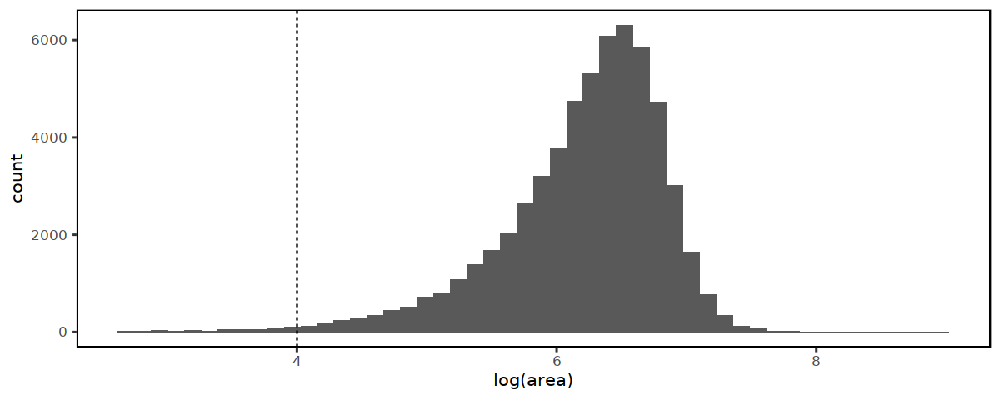

In [40]:
fig.size(4, 10)
cells$metadata %>% 
    ggplot(aes(log(area))) + 
        geom_histogram(bins = 50) + 
        geom_vline(xintercept = 4, linetype = 2) + 
        NULL


In [41]:
idx_keep <- which(log(cells$metadata$area) > 4)
cells$metadata <- cells$metadata[idx_keep, ]
cells$intensity <- cells$intensity[idx_keep, ]
cells$intensity_norm <- cells$intensity_norm[idx_keep, ]


## Number of cells post-QC 

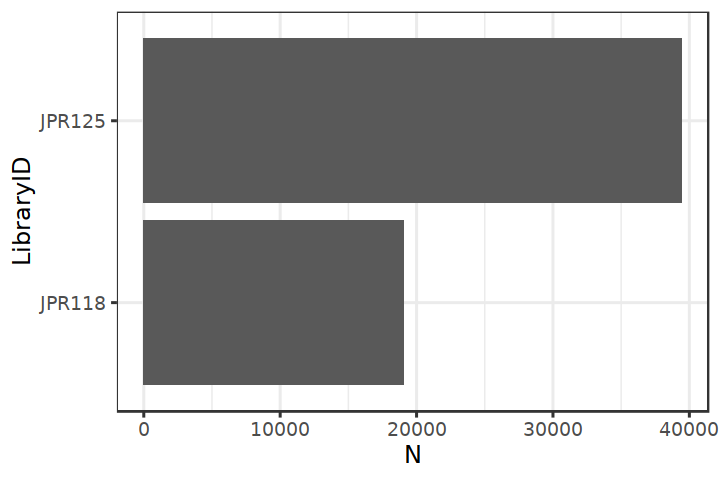

In [42]:
fig.size(4, 6)
data.table(cells$metadata)[, .N, by = LibraryID] %>% 
    ggplot(aes(LibraryID, N)) + 
        geom_bar(stat = 'identity') + 
        coord_flip() + 
        theme_bw(base_size = 14) + 
        NULL


In [ ]:
fig.size(6, 12)
do_scatter(data.frame(x = cells$metadata$y, y = -cells$metadata$x), cells$metadata, 'LibraryID')

## QC channels

In [43]:
channels_keep <- setdiff(colnames(cells$intensity), c('PSTAT1', 'CD11C', 'CD34', 'PANCADHERIN', 'CK8', 'CDH11', 'DAPI_INIT', 'DAPI_FINAL', 'MERTK')) ## these are very low quality 
cells$intensity <- cells$intensity[, channels_keep]
cells$intensity_norm <- cells$intensity_norm[, channels_keep]


## Viz channels (density)

In [44]:
cells <- do_scale(cells, z_thresh=3, within_batch=TRUE)

SCALE



Picking joint bandwidth of 0.0991

Picking joint bandwidth of 0.14



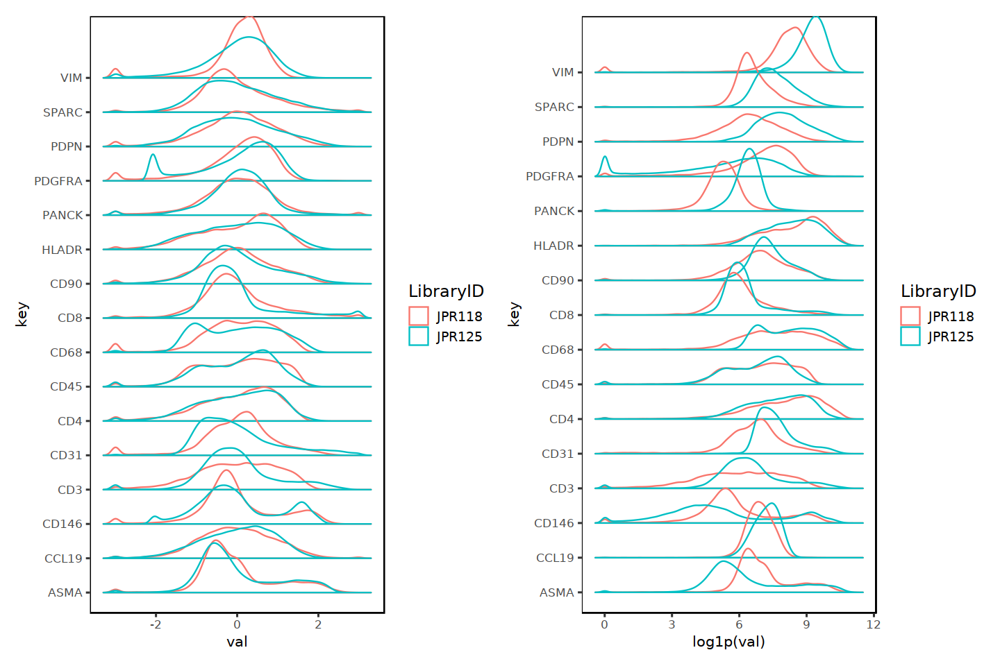

In [46]:
fig.size(8, 12)
cells$z %>% 
    data.frame() %>% 
    tibble::rownames_to_column('CellID') %>% 
    cbind(LibraryID = cells$metadata$LibraryID) %>% 
    tidyr::gather(key, val, all_of(colnames(cells$intensity_norm))) %>% 
    ggplot(aes(val, key, color = LibraryID)) + 
        geom_density_ridges2(fill = NA) + 
        NULL |  
cells$intensity_norm %>% 
    tibble::rownames_to_column('CellID') %>% 
    cbind(LibraryID = cells$metadata$LibraryID) %>% 
    tidyr::gather(key, val, all_of(colnames(cells$intensity_norm))) %>% 
    ggplot(aes(log1p(val), key, color = LibraryID)) + 
        geom_density_ridges2(fill = NA) + 
        NULL 


## Viz intensities (space)

In [47]:
# fig.size(12, 18)
# features_plot <- colnames(cells$intensity_norm)
# suppressWarnings({
#     plotFeatures(
#         log1p(t(cells$intensity_norm)), 
#         data.frame(x = cells$metadata$y, y = -cells$metadata$x), 
#         features_plot, 
#         nrow = floor(sqrt(length(features_plot))),
#         no_guide = TRUE, 
#         empty_theme = TRUE
#     )    
# })


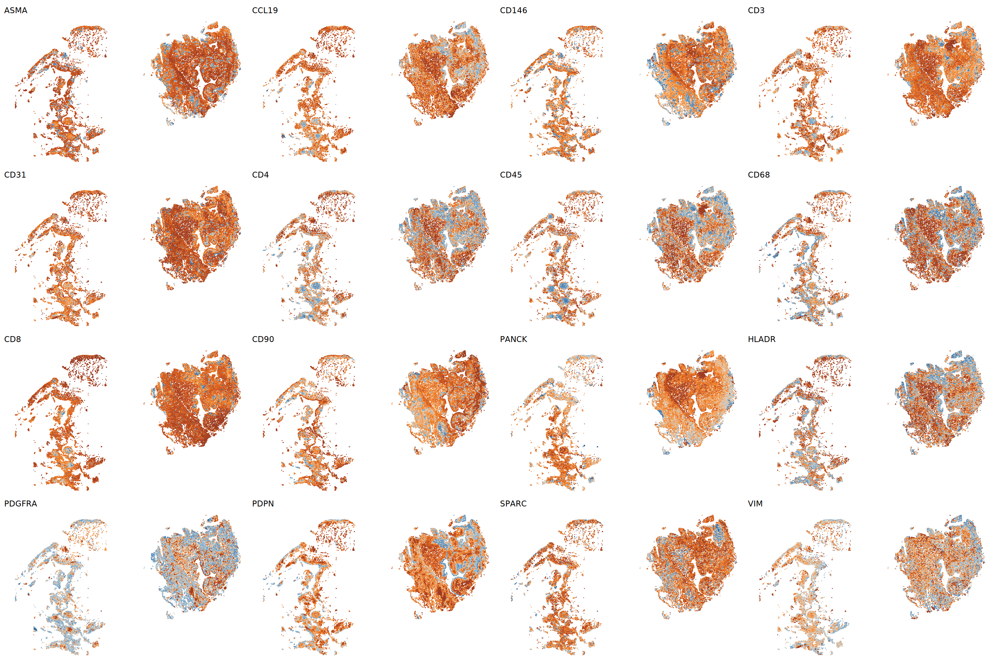

In [48]:
fig.size(16, 24)
features_plot <- colnames(cells$intensity_norm)
suppressWarnings({
    plotFeatures(
        t(cells$z), 
        data.frame(x = cells$metadata$y, y = -cells$metadata$x), 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cache

In [49]:
saveRDS(cells, '../../data/CellDive/results/synovium_cells.rds')

# Niche analysis

In [50]:
cells <- readRDS('../../data/CellDive/results/synovium_cells.rds')
spots <- make_spots(cells)

## PCA -> UMAP -> Harmony -> UMAP

UMAP

UMAP

PCA

SCALE

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2923550)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2923550)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



    user   system  elapsed 
 802.171 1638.591  310.140 

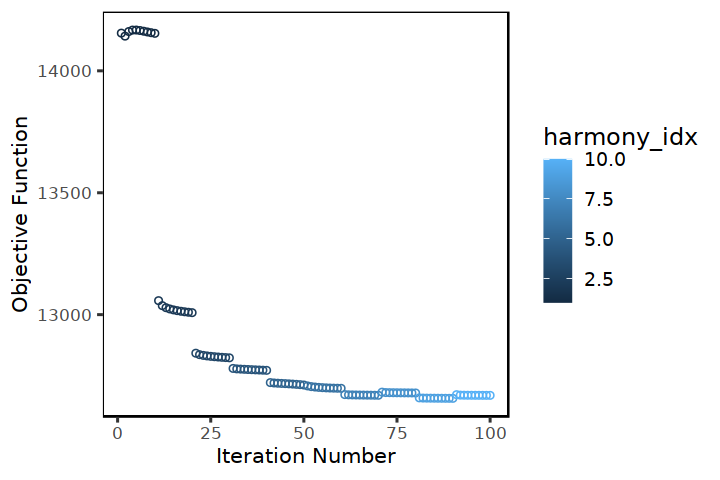

In [51]:
system.time({
    spots <- spots %>% 
        do_norm() %>% 
        do_scale(3, TRUE) %>% 
        do_pca() %>% 
        do_umap('V', 'U0') %>% 
        harmonize() %>% 
        do_umap('H', 'U1') %>% 
        identity()
})


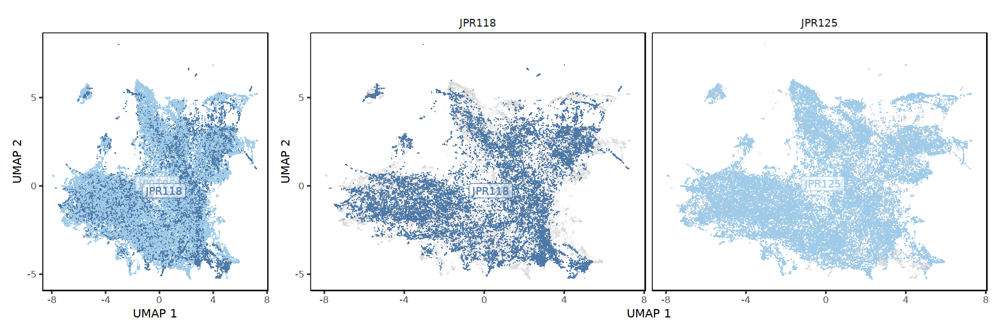

In [52]:
fig.size(5, 15)
(
    do_scatter(spots$U1$embedding, spots$metadata, 'LibraryID') | 
    do_scatter(spots$U1$embedding, spots$metadata, 'LibraryID', quo(LibraryID)) 
) + 
plot_layout(widths = c(1, 3))



## Viz intensities

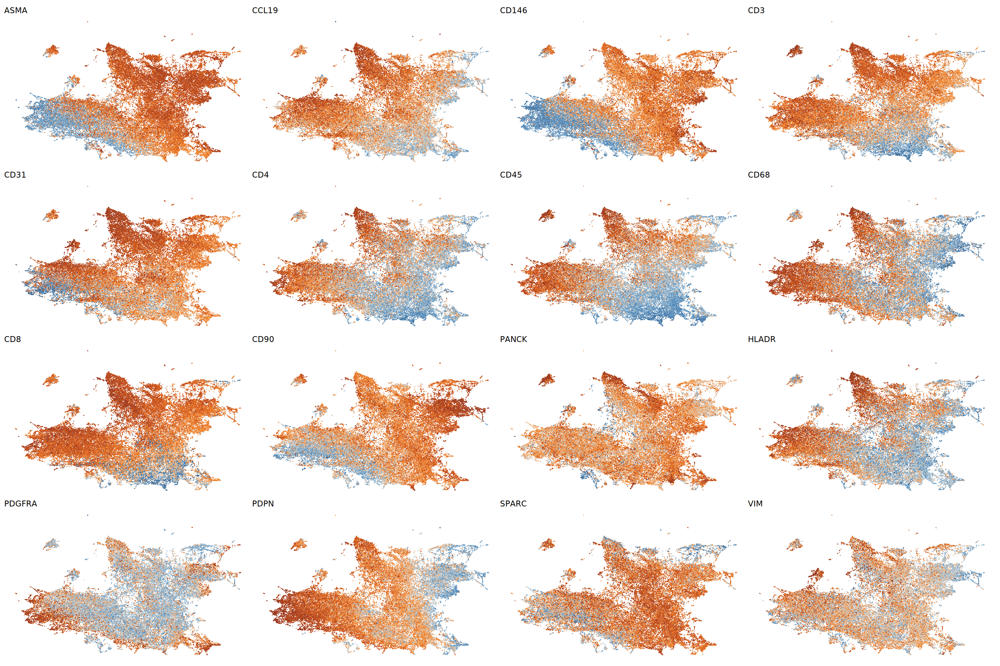

In [67]:
fig.size(16, 24)
features_plot <- colnames(cells$z)
suppressWarnings({
    plotFeatures(
        t(cells$z), 
        data.frame(spots$U1$embedding), 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cluster

In [59]:
system.time({
    spots <- spots %>% 
        do_louvain('U1', c(.1, .4, .8, 1.2)) %>% 
        do_markers()
})


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 580192

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9244
Number of communities: 5
Elapsed time: 5 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 580192

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8589
Number of communities: 15
Elapsed time: 5 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 580192

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8175
Number of communities: 28
Elapsed time: 6 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 580192

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7950
Number of communities: 34
Elapsed time: 6 seconds


New names:
* NA -> ...1
* NA -> ...2
* NA -> ...3
* NA -> ...4



   user  system elapsed 
 25.397   0.047  25.464 

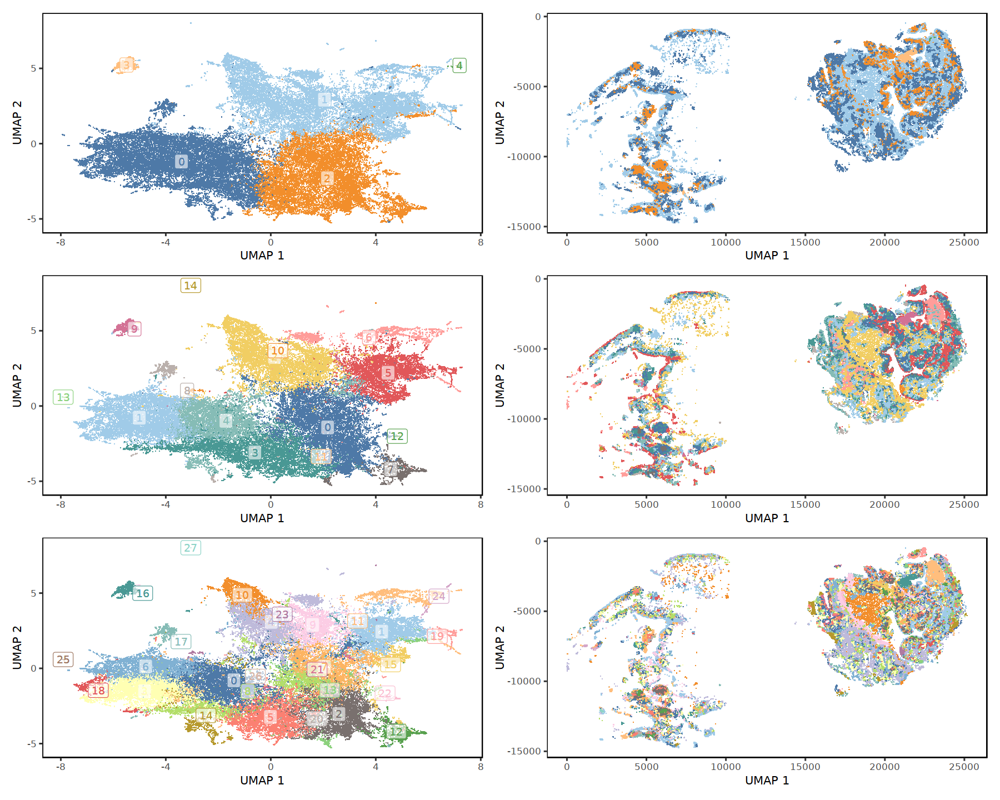

In [60]:
## Only plot up to 33 colors 
clusters_plot <- names(which(spots$Clusters %>% map(table) %>% map_int(length) <= length(colors_overload)))
fig.size(4 * length(clusters_plot), 15)
map(clusters_plot, function(.name) {
    do_scatter(spots$U1$embedding, spots$Clusters, .name) |
    do_scatter(data.frame(x = spots$metadata$y, y = -spots$metadata$x), spots$Clusters, .name, do_labels = FALSE)
}) %>% 
    reduce(`/`)


In [61]:
# fig.size(18, 18)
# do_scatter(spots$U1$embedding, spots$metadata, 'Cluster', quo(Cluster), do_labels=FALSE, nrow=5)


In [62]:
# fig.size(4, 10)
# X <- mres %>% 
#     subset(feature %in% c('ACTA2', 'CD146', 'CD3', 'CD31', 'CD45', 'CD68', 'PANCK')) %>% 
#     subset(!group %in% c('C22')) %>% 
#     dplyr::select(SCORE=auc, feature, group) %>% 
#     tidyr::spread(group, SCORE) %>% 
#     tibble::column_to_rownames('feature') %>% 
#     as('matrix') 
# # o <- order(as.integer(gsub('C', '', colnames(X))))
# # Heatmap(X[, o], cluster_columns = FALSE)
# # X <- X %>% t %>% scale %>% t %>% scale
# Heatmap(X, column_names_rot = 45)


## Cache

In [63]:
saveRDS(spots, '../../data/CellDive/results/synovium_spots.rds')

# Cell analysis

Now let's find those fibroblasts! 


In [64]:
cells <- readRDS('../../data/CellDive/results/synovium_cells.rds')


## PCA -> UMAP -> Harmony -> UMAP

UMAP

UMAP

PCA

SCALE

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2923550)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2923550)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



    user   system  elapsed 
 799.708 1333.644  351.106 

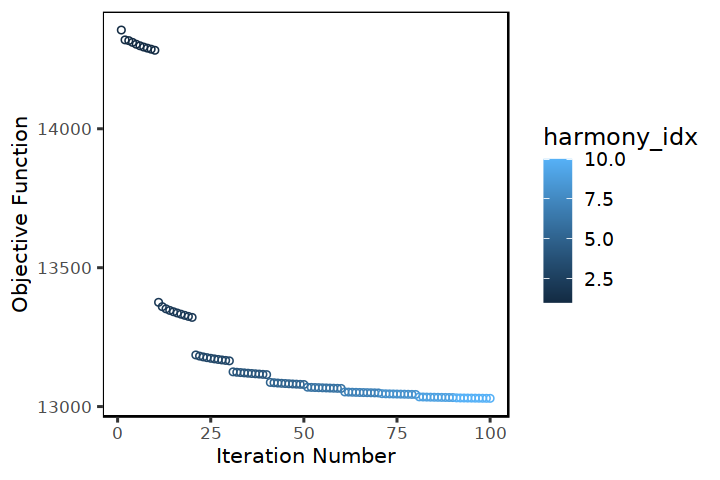

In [65]:
system.time({
    cells <- cells %>% 
        do_norm() %>% 
        do_scale(3, TRUE) %>% 
        do_pca() %>% 
        do_umap('V', 'U0') %>% 
        harmonize() %>% 
        do_umap('H', 'U1') %>% 
        identity()
})


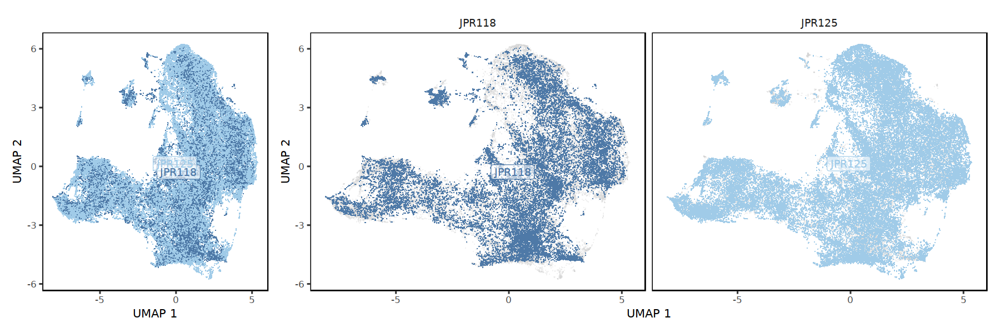

In [66]:
fig.size(5, 15)
with(cells, {
    (
        do_scatter(U1$embedding, metadata, 'LibraryID') | 
        do_scatter(U1$embedding, metadata, 'LibraryID', quo(LibraryID)) 
    ) + 
    plot_layout(widths = c(1, 3))
})


## Viz intensities

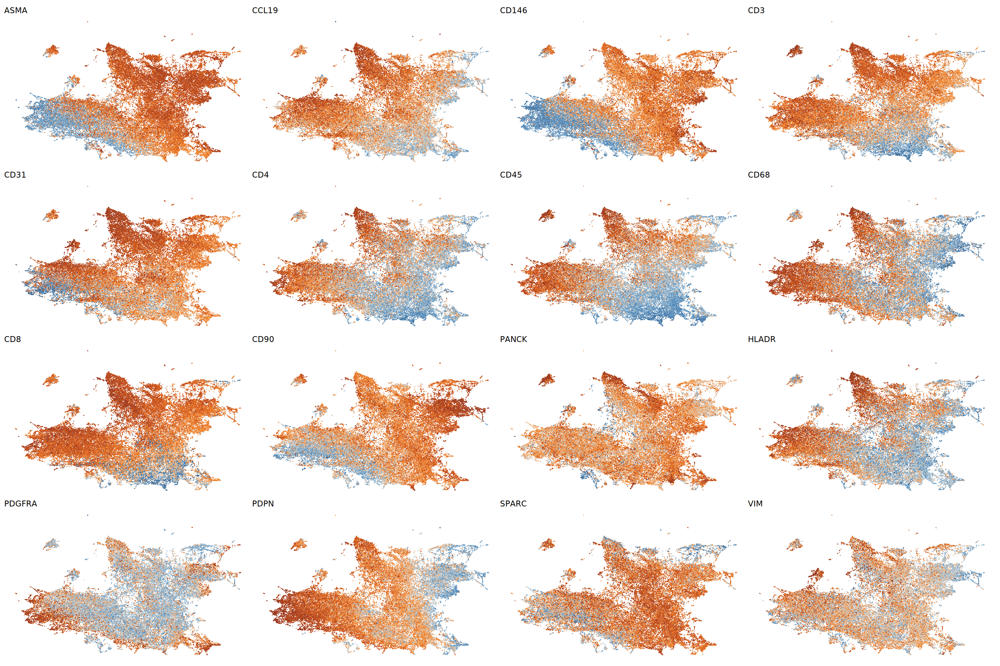

In [67]:
fig.size(16, 24)
features_plot <- colnames(cells$z)
suppressWarnings({
    plotFeatures(
        t(cells$z), 
        data.frame(spots$U1$embedding), 
        features_plot, 
        nrow = floor(sqrt(length(features_plot))),
        no_guide = TRUE, 
        empty_theme = TRUE
    )    
})


## Cluster

In [68]:
system.time({
    cells <- cells %>% 
        do_louvain('U1', c(.1, .4, .8, 1.2)) %>% 
        do_markers()
})


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 621341

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9217
Number of communities: 3
Elapsed time: 14 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 621341

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8437
Number of communities: 10
Elapsed time: 19 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 621341

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8056
Number of communities: 18
Elapsed time: 24 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 58471
Number of edges: 621341

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7785
Number of communities: 29
Elapsed time: 20 seconds


New names:
* NA -> ...1
* NA -> ...2
* NA -> ...3
* NA -> ...4



   user  system elapsed 
 79.766   0.089  79.950 

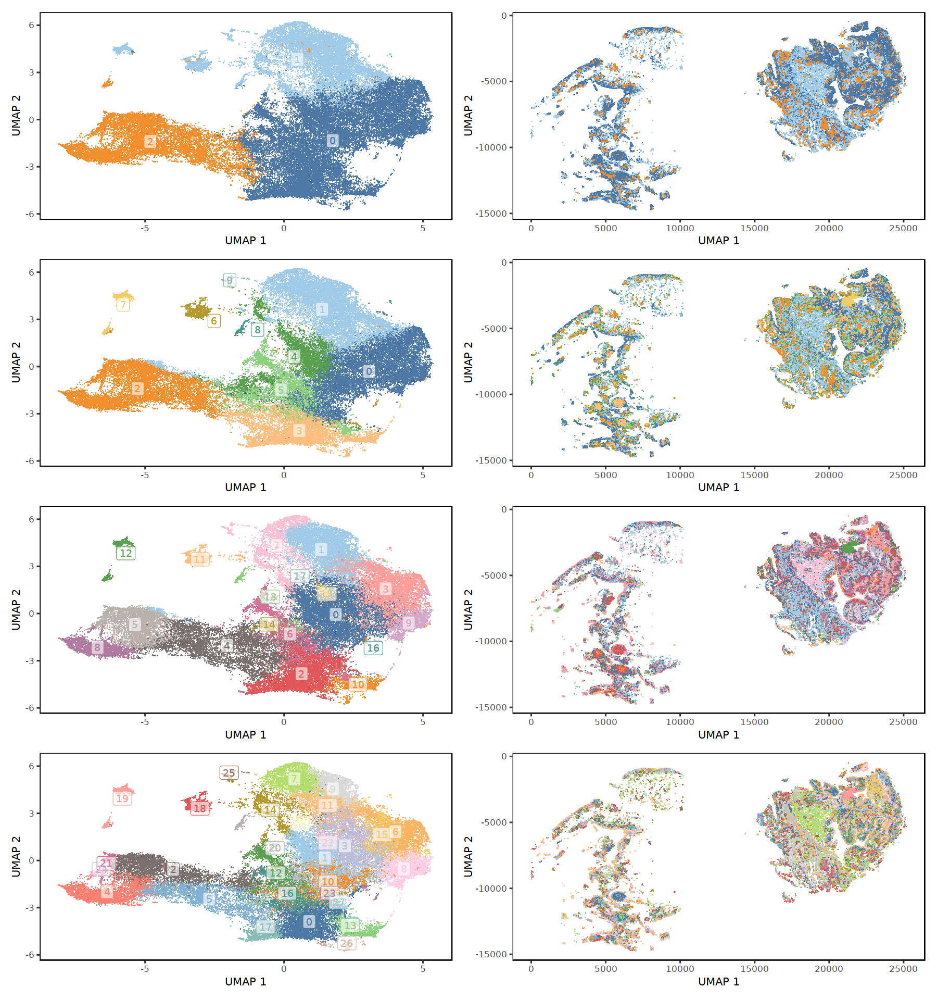

In [69]:
## Only plot up to 33 colors 
with(cells, {
    clusters_plot <- names(which(Clusters %>% map(table) %>% map_int(length) <= length(colors_overload)))
    fig.size(4 * length(clusters_plot), 15)
    map(clusters_plot, function(.name) {
        do_scatter(U1$embedding, Clusters, .name) |
        do_scatter(data.frame(x = metadata$y, y = -metadata$x), Clusters, .name, do_labels = FALSE)
    }) %>% 
        reduce(`/`)
    
})


## Cache

In [70]:
saveRDS(cells, '../../data/CellDive/results/synovium_cells.rds')